In [37]:
import math
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation

In [38]:
length = 3  # length of pendulum
theta = math.pi / 4  # initial angle (45 degrees)
alpha = math.pi / 6 # angle of nail contact in relation to vertical (30 degrees)
num_steps = 1000  # number of simulation steps
num_steps_for_animation = 1000
dt = 0.01  # time step
g = 9.81  # gravity
v0 = 0  # initial velocity

In [39]:
def simulate_pendulum(init_velocity, length_):
    global theta
    coordinates = []

    x = length_ * math.sin(theta)
    y = -length_ * math.cos(theta)
    velocity = init_velocity

    for _ in range(num_steps):
        acceleration = -g/length_ * math.sin(theta)
        velocity += acceleration * dt
        theta += velocity * dt

        x = length_ * math.sin(theta)
        y = -length_ * math.cos(theta)
        coordinates.append((x, y))

    return coordinates

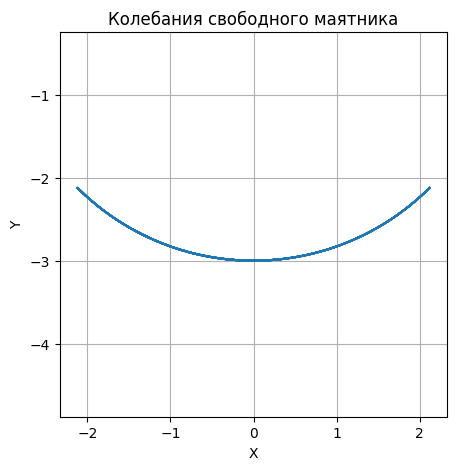

In [40]:
coordinates = simulate_pendulum(v0, length)
x_values, y_values = zip(*coordinates)


plt.figure(figsize=(5,5))
plt.plot(x_values, y_values)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Колебания свободного маятника')
plt.grid(True)
plt.axis('equal')
plt.show()

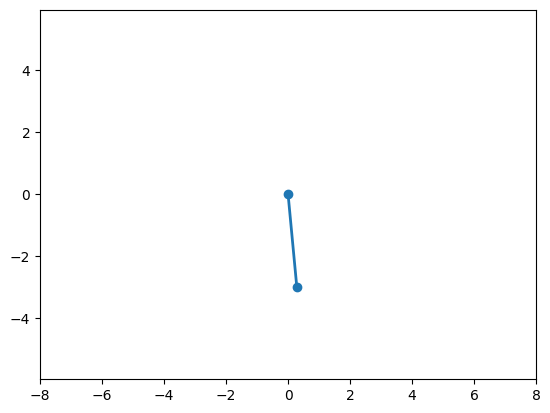

In [41]:
fig, ax = plt.subplots()
plt.axis('equal')
ax.set_xlim(-length-5, length+5)
ax.set_ylim(-length-5, length+5)
line, = ax.plot([], [], 'o-', lw=2)

def init():
    line.set_data([], [])
    return line,

def animate(i):
    x = x_values[i]
    y = y_values[i]
    line.set_data([0, x], [0, y])
    return line,

ani = animation.FuncAnimation(fig, animate, frames=num_steps_for_animation, init_func=init, blit=True)
HTML(ani.to_jshtml())

In [42]:
def get_period():
    peaks = []
    for i in range(1, len(y_values) - 2):
        if y_values[i - 1] < y_values[i] > y_values[i + 1]:
            peaks.append(i)
    return peaks[1] * dt

In [43]:
print("Период свободного колебания: =", get_period())

Период свободного колебания: = 3.6


In [46]:
def get_new_length(previous_length, angle) -> float: # dont work!
    return previous_length 


def nailed_movement(angle, velocity, new_length) -> tuple[list, float]:
    coordinates_ = []

    x = length * math.sin(angle)
    y = -length * math.cos(angle)
    flag = False

    for _ in range(num_steps):
        if angle == alpha and flag: # change to not percisely equal
            return coordinates, velocity
        acceleration = -g/new_length * math.sin(angle)
        velocity += acceleration * dt
        angle += velocity * dt
        flag = True
        x = new_length * math.sin(angle)
        y = -new_length * math.cos(angle)
        coordinates_.append((x, y))


def pendulum_with_nail(init_velocity, length_):
    global theta, alpha
    coordinates_ = []

    x = length * math.sin(theta)
    y = -length * math.cos(theta)

    velocity = init_velocity

    for _ in range(num_steps):
        if theta == alpha:
            nailed_coordinates = nailed_movement(theta, velocity, get_new_length(length_, theta))
            coordinates.append(nailed_coordinates[0])
            velocity = nailed_coordinates[1]

        acceleration = -g/length * math.sin(theta)
        velocity += acceleration * dt
        theta += velocity * dt

        x = length * math.sin(theta)
        y = -length * math.cos(theta)
        coordinates_.append((x, y))

    return coordinates_

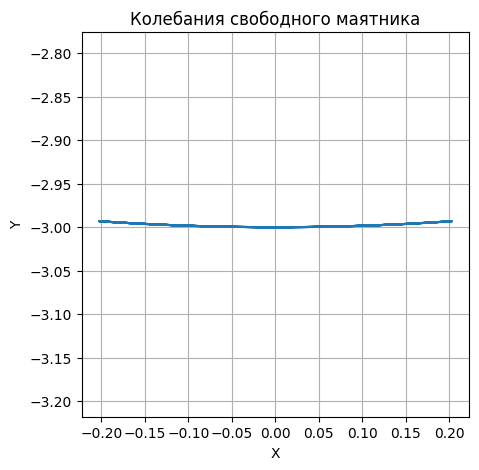

In [47]:
coordinates = pendulum_with_nail(v0, length)
x_values, y_values = zip(*coordinates)


plt.figure(figsize=(5,5))
plt.plot(x_values, y_values)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Колебания свободного маятника')
plt.grid(True)
plt.axis('equal')
plt.show()